# Face Recognitions Classifications Model Exploration

## Overview

In this exploration, we aim to investigate the effectiveness of various deep learning models for image classification tasks. Specifically, we will focus on three popular architectures: VGG16, Inception v3, and Inception v1 (GoogLeNet).

### VGG16
VGG16 is a convolutional neural network (CNN) architecture proposed by the Visual Geometry Group at the University of Oxford. It consists of 16 weight layers and is known for its simplicity and effectiveness in image recognition tasks. The network architecture comprises a series of convolutional layers followed by max-pooling layers and fully connected layers.

### Inception v3
Inception v3 is an evolution of the original GoogLeNet architecture, developed by researchers at Google. It introduces several improvements over Inception v1, including factorized convolutions, batch normalization, and label smoothing. Inception v3 aims to achieve better accuracy and computational efficiency compared to its predecessor.

### InceptionResNetV2
InceptionResNetV2 is a deep convolutional neural network architecture that combines the principles of the Inception architecture and residual connections. It was proposed by Google researchers as an extension to the Inception family of networks.


## Methodology
1. **Dataset Selection**: Choose benchmark datasets such as CIFAR-10, CIFAR-100, or ImageNet for evaluation.
2. **Model Implementation**: Implement VGG16, Inception v3, and Inception v1 architectures using deep learning frameworks in Tensorflow.
3. **Training and Evaluation**: Train the models on the selected datasets and evaluate their performance in terms of accuracy, computational efficiency, and memory usage.
5. **Analysis and Comparison**: Analyze the results to compare the performance of different architectures and draw insights into their strengths and weaknesses.

## Expected Outcomes
- Identification of the most suitable architecture for image classification tasks based on performance metrics.
- Insights into the trade-offs between accuracy, computational efficiency, and model complexity.

---


# Import Pre-requisites Packages

In [1]:
import pandas as pd
import os
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from tensorflow.keras.applications import InceptionV3, InceptionResNetV2, VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential, load_model
import numpy as np
from sklearn.metrics import roc_curve, confusion_matrix
import time
import keras

2024-03-18 06:46:59.846135: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-03-18 06:46:59.884426: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-18 06:47:00.562371: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Hardware Specifications

In [2]:
import cpuinfo
import psutil
import GPUtil

def print_hardware_info():
    cpu_info = cpuinfo.get_cpu_info()
    print("CPU Information:")
    print("Architecture:", cpu_info['arch'])
    print("Cores:", psutil.cpu_count(logical=False))
    print("Threads:", psutil.cpu_count(logical=True))
    print()

    mem_info = psutil.virtual_memory()
    print("Memory Information:")
    print("Total Memory:", f"{mem_info.total / (1024 ** 3):.2f} GB")
    print("Available Memory:", f"{mem_info.available / (1024 ** 3):.2f} GB")
    print()

    gpus = GPUtil.getGPUs()
    if gpus:
        print("GPU Information:")
        for i, gpu in enumerate(gpus):
            print(f"GPU {i+1}:")
            print("Name:", gpu.name)
            print("Memory Total:", f"{gpu.memoryTotal:.2f} MB")
            print("Memory Used:", f"{gpu.memoryUsed:.2f} MB")
            print("Memory Free:", f"{gpu.memoryFree:.2f} MB")
            print("Utilization:", f"{gpu.load * 100:.2f}%")
            print()
    else:
        print("No GPU detected.")

print_hardware_info()

CPU Information:
Architecture: X86_64
Cores: 6
Threads: 12

Memory Information:
Total Memory: 29.38 GB
Available Memory: 26.04 GB

GPU Information:
GPU 1:
Name: NVIDIA GeForce RTX 3050
Memory Total: 8192.00 MB
Memory Used: 1223.00 MB
Memory Free: 6820.00 MB
Utilization: 13.00%



# Exploratory Data Analysis

Next we cleansing the data based on the pre-requisites of binary data generator.

I decide to reads data from a CSV file named 'list_attribute.txt', filters the data based on filenames present in the 'images/' directory, and displays the filtered data.

In this experimentations I'm using datasets provided by AI Indonesia, which is a subset data from CelebA datasets.

In [3]:
df = pd.read_csv('list_attribute.txt', sep='\s+', index_col=0)
image_files = os.listdir('images/')
filtered_df = df[df.index.isin(image_files)]
filtered_df.head()

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
000051.jpg,1,-1,-1,1,1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
000052.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,-1,...,-1,-1,1,-1,-1,-1,-1,-1,-1,-1
000065.jpg,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,...,-1,1,1,-1,-1,-1,-1,-1,-1,1
000166.jpg,1,-1,-1,-1,-1,-1,-1,1,-1,-1,...,1,-1,-1,-1,-1,1,-1,-1,-1,-1
000198.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


In [4]:
# Normalized filtered dataframe for easier training

filtered_df.reset_index(inplace=True)
filtered_df = filtered_df.rename(columns={'index': 'Filename'})

clean_df = filtered_df[['Filename', 'Male']]
clean_df.loc[:, ('Male')] = clean_df['Male'].astype('str')

clean_df.head()

/tmp/ipykernel_28927/2189718664.py:7: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['1' '1' '1' ... '-1' '-1' '1']' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  clean_df.loc[:, ('Male')] = clean_df['Male'].astype('str')


,Filename,Male
0,000051.jpg,1
1,000052.jpg,1
2,000065.jpg,1
3,000166.jpg,1
4,000198.jpg,-1


In [5]:
# Split train and test data with 20% size.
# Then spliting train and validation from train data by 20% size also.

train_df, test_df = train_test_split(clean_df, test_size=0.2)

train_df, validation_df = train_test_split(train_df, test_size=0.2)

{'train': train_df.shape, 'test': test_df.shape, 'validation': validation_df.shape}

{'train': (3200, 2), 'test': (1000, 2), 'validation': (800, 2)}

# Model Iterations #1

Parameters:

1. Batch size: 64
2. Seed: 1024
3. Target Size: (128, 128)
4. Validation datasets size: 20%
5. Data test size: 20%
7. Additional fully connected layer:
   1. Global Conv 2d
   2. Relu
   3. Sigmoid
8. Epoch: 20
9.  Optimizers: adam
10. Pre-trained data: imagenet
11. Loss function: binary cross entropy
12. Layer freeze: true
13. Model input shape: (128, 128, 3)

### Training and Validation Image Generator

In [6]:
BATCH_SIZE = 64
SEED = 1024
TARGET_SIZE = (128, 128)

data_generator = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True, validation_split=0.2)

train_generator = data_generator.flow_from_dataframe(
 dataframe=train_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 subset='training',
 batch_size=BATCH_SIZE,
 seed=SEED,
 shuffle=True,
 class_mode='binary',
 target_size=TARGET_SIZE
)

validation_generator = data_generator.flow_from_dataframe(
 dataframe=validation_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 subset='validation',
 batch_size=BATCH_SIZE,
 seed=SEED,
 shuffle=True,
 class_mode='binary',
 target_size=TARGET_SIZE
)

Found 2560 validated image filenames belonging to 2 classes.
Found 160 validated image filenames belonging to 2 classes.


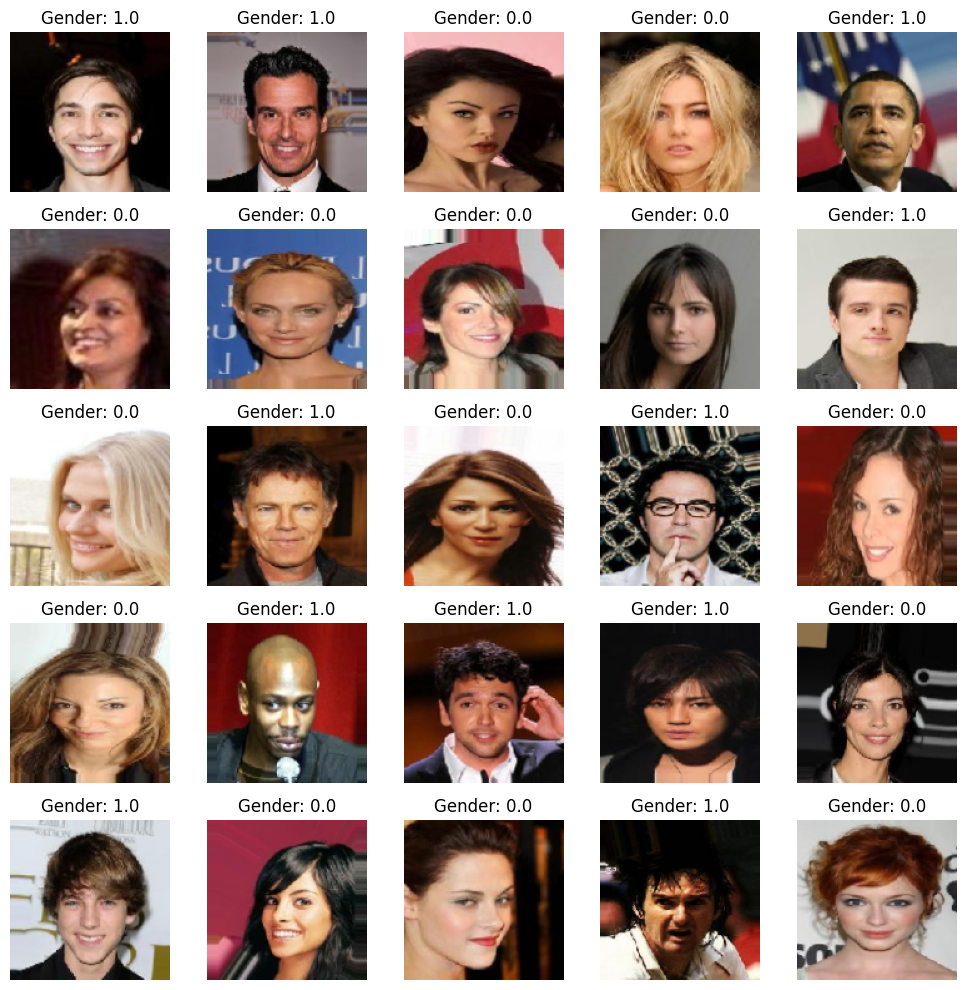

In [7]:
batch = next(train_generator)
fig, axs = plt.subplots(5, 5, figsize=(10, 10))
for i in range(5):
    for j in range(5):
        index = i*5+j
        axs[i, j].imshow(batch[0][index])
        axs[i, j].axis('off')
        axs[i, j].set_title(f'Gender: {batch[1][index]}')

plt.tight_layout()
plt.show()

### Model Training

In [8]:
WEIGHTS = 'imagenet'
MODEL_INPUT_SHAPE = (128, 128, 3)


def input_model(base_model):
  name = base_model.name
  print(f"Freezing layers for model: {name}")
  for layer in base_model.layers:
    layer.trainable = False

  print(f"Adding fully connected layers for model: {name}")
  x = base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(128, activation='relu')(x)
  predictions = Dense(1, activation='sigmoid')(x)
  model = keras.Model(inputs=base_model.input, outputs=predictions)

  return model

models = {}

models['inceptionV3'] = input_model(InceptionV3(weights=WEIGHTS, include_top=False, input_shape=MODEL_INPUT_SHAPE, classifier_activation=None))
models['inceptionResNetV2'] = input_model(InceptionResNetV2(weights=WEIGHTS, include_top=False, input_shape=MODEL_INPUT_SHAPE, classifier_activation=None))
models['vgg16'] = input_model(VGG16(weights=WEIGHTS, include_top=False, input_shape=MODEL_INPUT_SHAPE, classifier_activation=None))

models

2024-03-18 06:47:04.389891: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-03-18 06:47:04.423311: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-03-18 06:47:04.423861: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-03-18 06:47:04.426281: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:984] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-03-18 06:47:04.426855: I external/local_xla/xla/stream_executor

Freezing layers for model: inception_v3
Adding fully connected layers for model: inception_v3
Freezing layers for model: inception_resnet_v2
Adding fully connected layers for model: inception_resnet_v2
Freezing layers for model: vgg16
Adding fully connected layers for model: vgg16


{'inceptionV3': <Functional name=functional_1, built=True>,
 'inceptionResNetV2': <Functional name=functional_3, built=True>,
 'vgg16': <Functional name=functional_5, built=True>}

In [9]:
histories = {}

for name, model in models.items():
  print(f"Start training for model: {name}")
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  history = model.fit(train_generator, epochs=20, validation_data=validation_generator)
  histories.update({name: history})

Start training for model: inceptionV3
Epoch 1/20


/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1710719234.888588   29035 service.cc:145] XLA service 0x7efc58002ad0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1710719234.888631   29035 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 3050, Compute Capability 8.6
2024-03-18 06:47:15.009872: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-03-18 06:47:15.953083: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 890

 1/40 ━━━━━━━━━━━━━━━━━━━━ 11:15 17s/step - accuracy: 0.5781 - loss: 1.4570

I0000 00:00:1710719247.020127   29035 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


39/40 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - accuracy: 0.6279 - loss: 1.1987

I0000 00:00:1710719256.436418   29228 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_2420', 184 bytes spill stores, 524 bytes spill loads



40/40 ━━━━━━━━━━━━━━━━━━━━ 34s 428ms/step - accuracy: 0.6323 - loss: 1.1753 - val_accuracy: 0.7937 - val_loss: 0.4863
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.8424 - loss: 0.3710 - val_accuracy: 0.8062 - val_loss: 0.3873
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 117ms/step - accuracy: 0.8572 - loss: 0.3396 - val_accuracy: 0.8313 - val_loss: 0.3801
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.8715 - loss: 0.3065 - val_accuracy: 0.7750 - val_loss: 0.4186
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.8695 - loss: 0.3072 - val_accuracy: 0.8500 - val_loss: 0.3098
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 121ms/step - accuracy: 0.8774 - loss: 0.2988 - val_accuracy: 0.8375 - val_loss: 0.3974
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.8950 - loss: 0.2535 - val_accuracy: 0.8813 - val_loss: 0.3499
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - accuracy: 0.8767 - loss: 0.2728 - val_accuracy: 0.8500 - val

I0000 00:00:1710719384.134138   30015 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_20554', 176 bytes spill stores, 176 bytes spill loads

I0000 00:00:1710719384.852802   30013 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_20776', 492 bytes spill stores, 492 bytes spill loads

I0000 00:00:1710719384.928794   30014 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_20776', 428 bytes spill stores, 428 bytes spill loads



40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - accuracy: 0.7528 - loss: 0.7418

I0000 00:00:1710719404.173226   30142 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_5367', 176 bytes spill stores, 176 bytes spill loads



40/40 ━━━━━━━━━━━━━━━━━━━━ 39s 461ms/step - accuracy: 0.7545 - loss: 0.7356 - val_accuracy: 0.8250 - val_loss: 0.4536
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - accuracy: 0.8862 - loss: 0.2854 - val_accuracy: 0.8562 - val_loss: 0.3709
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - accuracy: 0.9029 - loss: 0.2471 - val_accuracy: 0.8375 - val_loss: 0.4182
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - accuracy: 0.8909 - loss: 0.2674 - val_accuracy: 0.8813 - val_loss: 0.3122
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - accuracy: 0.8946 - loss: 0.2345 - val_accuracy: 0.8625 - val_loss: 0.3250
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - accuracy: 0.9167 - loss: 0.2129 - val_accuracy: 0.8813 - val_loss: 0.3156
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 129ms/step - accuracy: 0.9065 - loss: 0.2247 - val_accuracy: 0.8562 - val_loss: 0.2856
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step - accuracy: 0.9166 - loss: 0.2068 - val_accuracy: 0.8375 - val

I0000 00:00:1710719527.552694   30932 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1165', 492 bytes spill stores, 492 bytes spill loads

I0000 00:00:1710719527.602267   30926 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1165', 428 bytes spill stores, 428 bytes spill loads



40/40 ━━━━━━━━━━━━━━━━━━━━ 19s 248ms/step - accuracy: 0.6932 - loss: 0.5735 - val_accuracy: 0.8000 - val_loss: 0.4369
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8231 - loss: 0.3870 - val_accuracy: 0.8375 - val_loss: 0.4179
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - accuracy: 0.8516 - loss: 0.3350 - val_accuracy: 0.8375 - val_loss: 0.3504
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.8689 - loss: 0.3118 - val_accuracy: 0.8375 - val_loss: 0.3726
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.8654 - loss: 0.3059 - val_accuracy: 0.8125 - val_loss: 0.3750
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.8960 - loss: 0.2781 - val_accuracy: 0.8250 - val_loss: 0.4399
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - accuracy: 0.8800 - loss: 0.2789 - val_accuracy: 0.8250 - val_loss: 0.3946
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.8882 - loss: 0.2727 - val_accuracy: 0.8625 - val

### Model Validations

Model inceptionV3 last accuracy: 0.916015625
Model inceptionV3 last validation accuracy: 0.8374999761581421
Model inceptionV3 last loss: 0.21344590187072754
Model inceptionV3 last validation loss: 0.21344590187072754
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 302ms/step


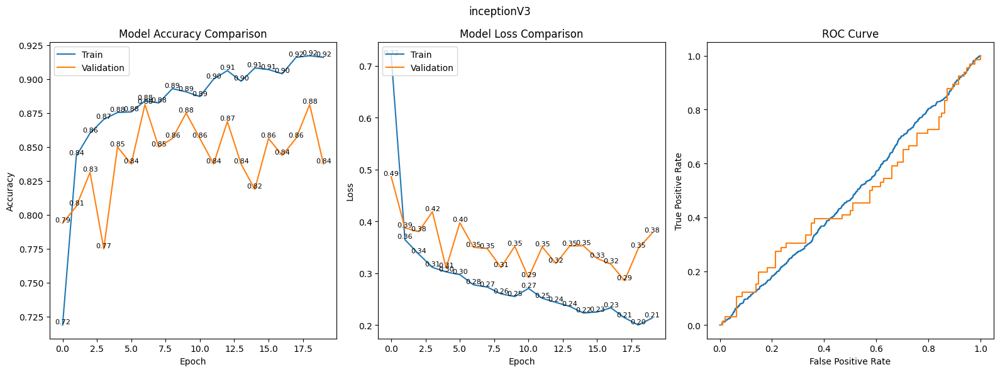

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


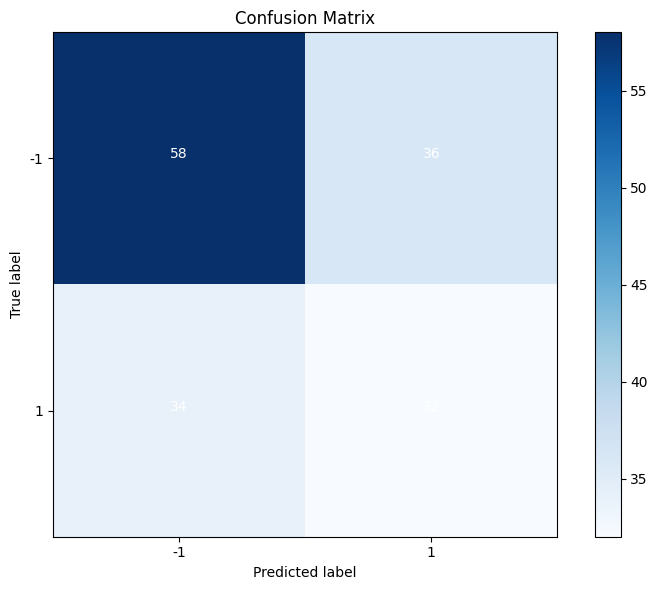

Model inceptionResNetV2 last accuracy: 0.934765636920929
Model inceptionResNetV2 last validation accuracy: 0.893750011920929
Model inceptionResNetV2 last loss: 0.16316057741641998
Model inceptionResNetV2 last validation loss: 0.16316057741641998
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


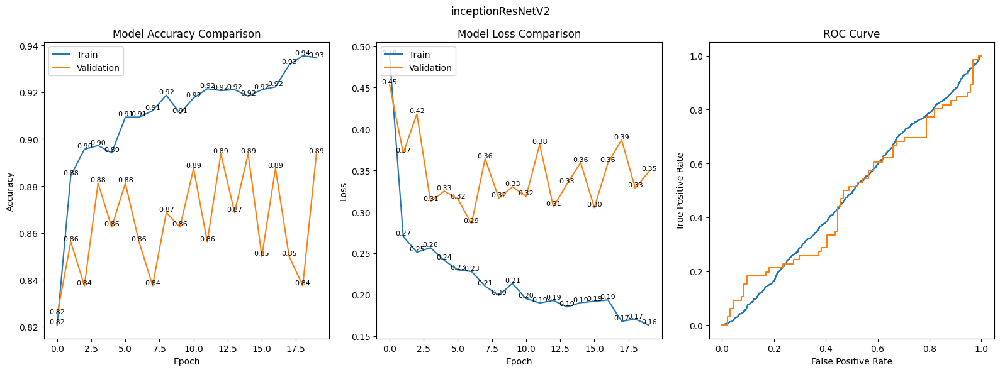

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


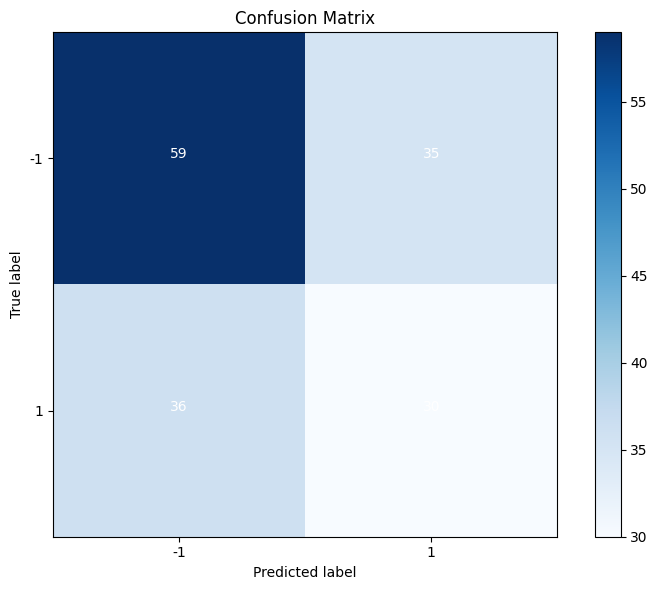

Model vgg16 last accuracy: 0.8980468511581421
Model vgg16 last validation accuracy: 0.862500011920929
Model vgg16 last loss: 0.25405630469322205
Model vgg16 last validation loss: 0.25405630469322205
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


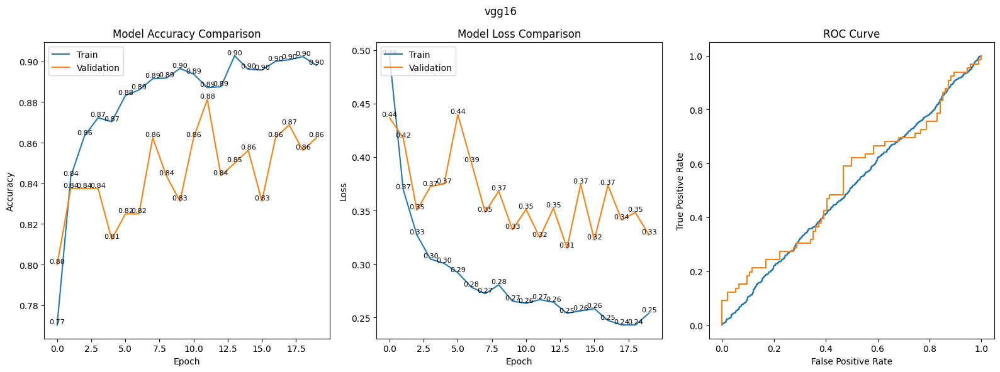

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


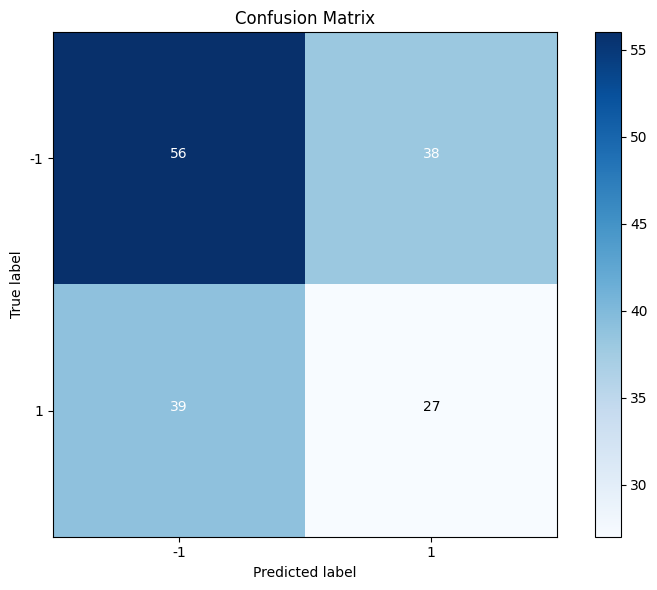

In [10]:
def plot_histories(histories):
    for name, history in histories.items():
        print(f"Model {name} last accuracy: {history.history['accuracy'][-1]}")
        print(f"Model {name} last validation accuracy: {history.history['val_accuracy'][-1]}")
        print(f"Model {name} last loss: {history.history['loss'][-1]}")
        print(f"Model {name} last validation loss: {history.history['loss'][-1]}")
        plt.figure(figsize=(16, 6))

        # Plot training & validation accuracy values
        plt.subplot(1, 3, 1)
        plt.plot(history.history['accuracy'], label='Train')
        plt.plot(history.history['val_accuracy'], label='Validation')
        plt.title('Model Accuracy Comparison')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend(loc='upper left')

        for i in range(len(history.history['accuracy'])):
            plt.text(i, history.history['accuracy'][i], f'{history.history["accuracy"][i]:.2f}', ha='center', va='bottom', fontsize=8)
        for i in range(len(history.history['val_accuracy'])):
            plt.text(i, history.history['val_accuracy'][i], f'{history.history["val_accuracy"][i]:.2f}', ha='center', va='bottom', fontsize=8)

        # Plot training & validation loss values
        plt.subplot(1, 3, 2)
        plt.plot(history.history['loss'], label='Train')
        plt.plot(history.history['val_loss'], label='Validation')
        plt.title('Model Loss Comparison')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend(loc='upper left')

        for i in range(len(history.history['loss'])):
            plt.text(i, history.history['loss'][i], f'{history.history["loss"][i]:.2f}', ha='center', va='bottom', fontsize=8)
        for i in range(len(history.history['val_loss'])):
            plt.text(i, history.history['val_loss'][i], f'{history.history["val_loss"][i]:.2f}', ha='center', va='bottom', fontsize=8)

        # ROC curve
        plt.subplot(1, 3, 3)
        y_pred_train = model.predict(train_generator, steps=None)
        fpr_train, tpr_train, thresholds_train = roc_curve(train_generator.classes, y_pred_train)
        plt.plot(fpr_train, tpr_train, label='Train ROC curve')

        y_pred_valid = model.predict(validation_generator, steps=None)
        fpr_valid, tpr_valid, thresholds_valid = roc_curve(validation_generator.classes, y_pred_valid)
        plt.plot(fpr_valid, tpr_valid, label='Validation ROC curve')

        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')

        plt.suptitle(name)
        plt.tight_layout()
        plt.show()

        # Confusion Matrix
        plt.figure(figsize=(8, 6))
        y_pred = model.predict(validation_generator).round()
        cm = confusion_matrix(validation_generator.classes, y_pred)
        plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.colorbar()
        tick_marks = np.arange(len(train_generator.class_indices))
        plt.xticks(tick_marks, train_generator.class_indices.keys())
        plt.yticks(tick_marks, train_generator.class_indices.keys())
        thresh = cm.max() / 2.
        for i, j in np.ndindex(cm.shape):
            plt.text(j, i, format(cm[i, j], 'd'), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
        plt.ylabel('True label')
        plt.xlabel('Predicted label')
        plt.tight_layout()
        plt.show()

plot_histories(histories)

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step


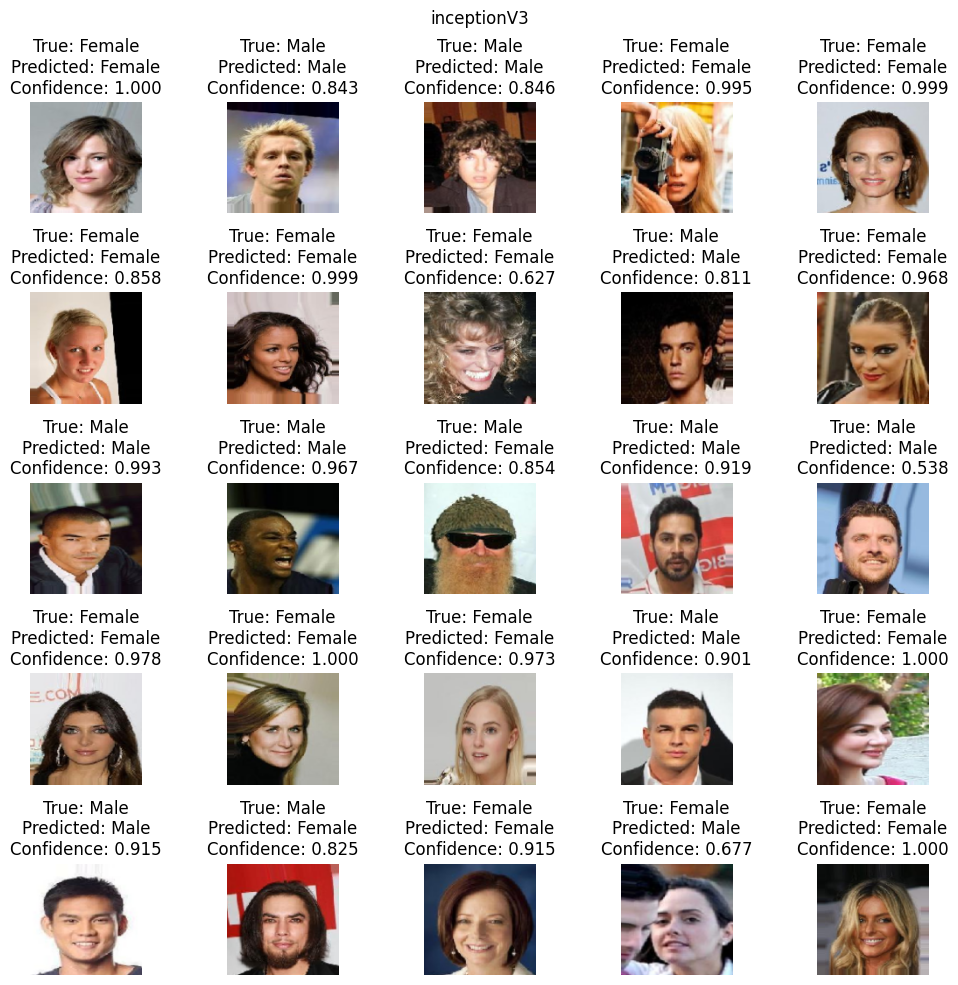

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 262ms/step


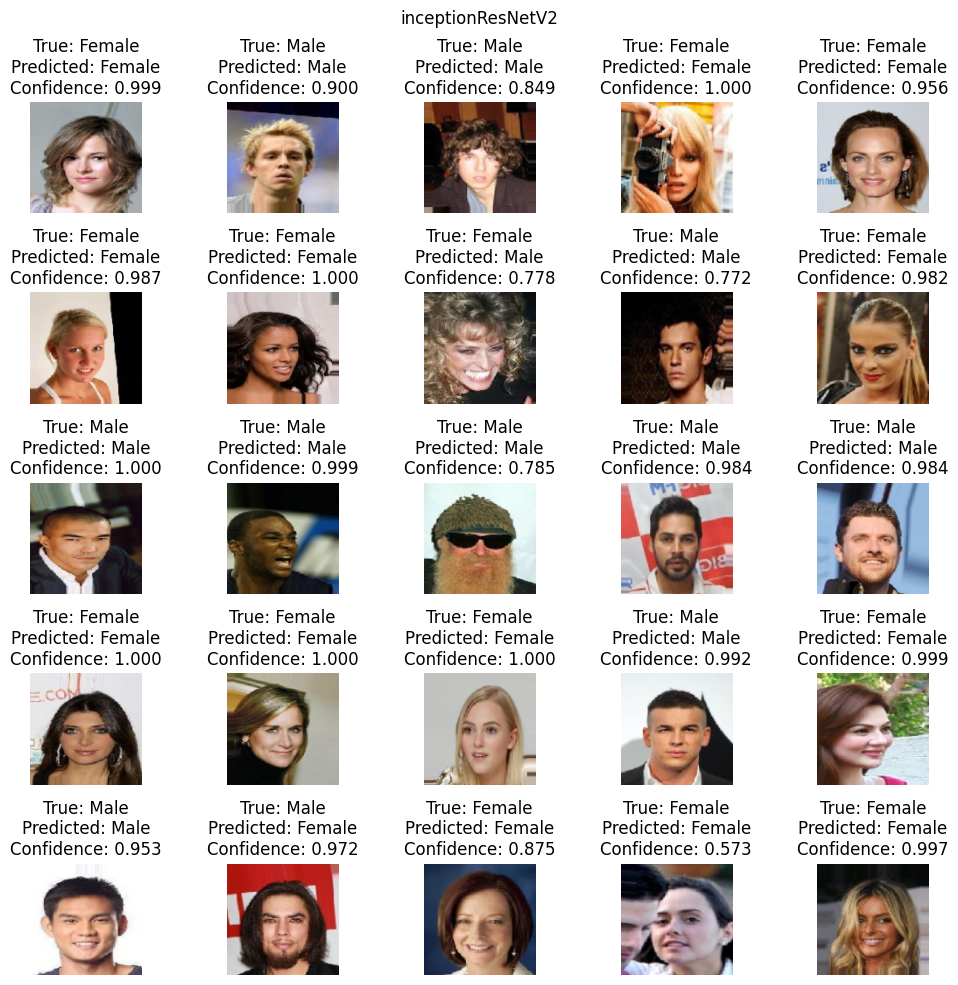

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step 


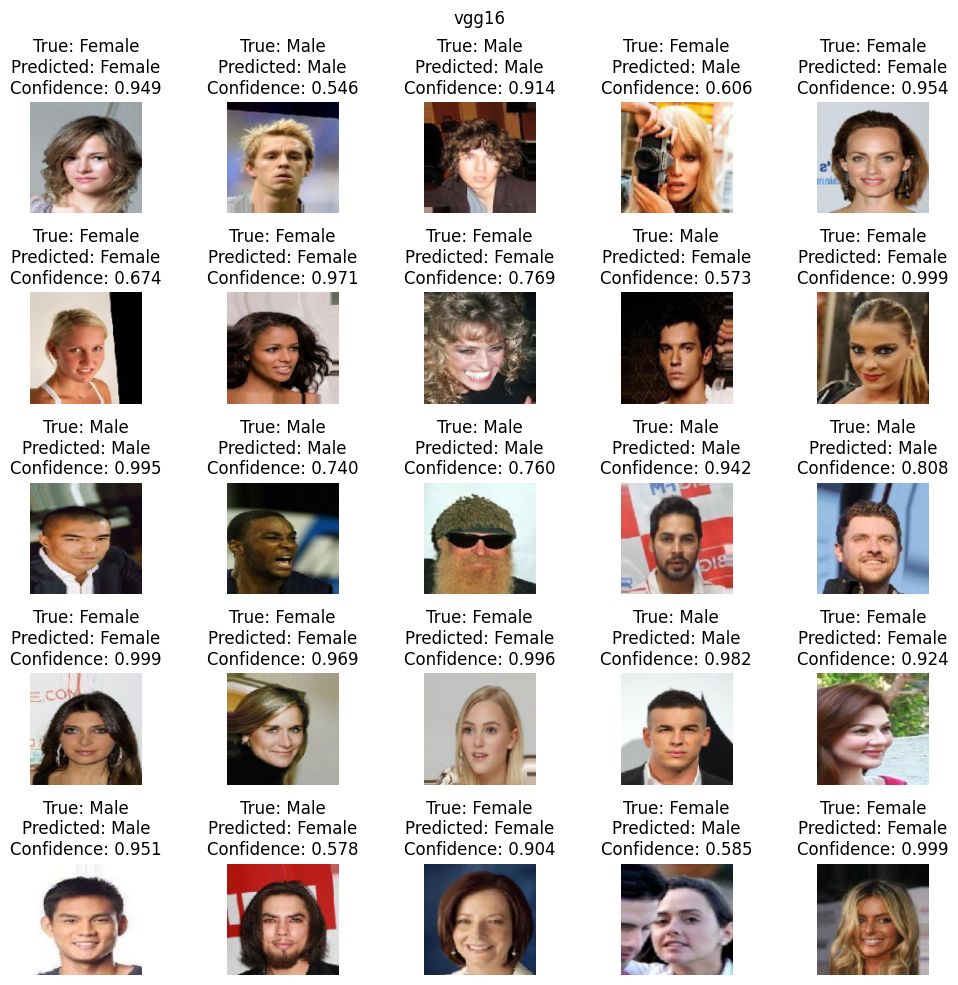

In [11]:
validation_generator.reset()

batch = next(validation_generator)

def plot_prediction(models, batch):
    for name, model in models.items():
        fig, axs = plt.subplots(5, 5, figsize=(10, 10))

        predictions = model.predict(batch[0])

        for i in range(5):
            for j in range(5):
                index = i * 5 + j
                axs[i, j].imshow(batch[0][index])
                axs[i, j].axis('off')
                true_label = 'Male' if batch[1][index] == 1 else 'Female'
                predicted_label = 'Male' if predictions[index] >= 0.5 else 'Female'
                confidence = predictions[index] if predicted_label == 'Male' else 1 - predictions[index]
                axs[i, j].set_title(f'True: {true_label}\nPredicted: {predicted_label}\nConfidence: {confidence[0]:.3f}')

        plt.suptitle(name)
        plt.tight_layout()
        plt.show()

plot_prediction(models, batch)

## Save Model

In [12]:
for name, model in models.items():
  model.save(f"./output/{name}-iteration-1.keras")

# Model Iterations #2

Parameters:

1. Batch size: 64
2. Seed: 1024
3. Target Size: (128, 128)
4. Validation datasets size: 20%
5. Data test size: 20%
7. Additional fully connected layer:
   1. Global Conv 2d
   2. Relu
   3. Sigmoid
8. Epoch: 50
9.  Optimizers: adam
10. Pre-trained data: imagenet
11. Loss function: binary cross entropy
12. Layer freeze: true
13. Model input shape: (128, 128, 3)

### Model Training

In [13]:
train_generator.reset()
validation_generator.reset()

histories = {}

for name, model in models.items():
  print(f"Start training for model: {name}")
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  history = model.fit(train_generator, epochs=30, validation_data=validation_generator)
  histories.update({name: history})

Start training for model: inceptionV3
Epoch 1/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 16s 220ms/step - accuracy: 0.9075 - loss: 0.2320 - val_accuracy: 0.8562 - val_loss: 0.3883
Epoch 2/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - accuracy: 0.9191 - loss: 0.1932 - val_accuracy: 0.8375 - val_loss: 0.3770
Epoch 3/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9414 - loss: 0.1758 - val_accuracy: 0.8562 - val_loss: 0.3539
Epoch 4/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - accuracy: 0.9286 - loss: 0.1843 - val_accuracy: 0.8375 - val_loss: 0.3308
Epoch 5/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 119ms/step - accuracy: 0.9295 - loss: 0.1862 - val_accuracy: 0.8625 - val_loss: 0.3451
Epoch 6/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 120ms/step - accuracy: 0.9164 - loss: 0.1930 - val_accuracy: 0.8562 - val_loss: 0.4317
Epoch 7/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - accuracy: 0.9326 - loss: 0.1811 - val_accuracy: 0.8562 - val_loss: 0.3606
Epoch 8/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 118ms/step - accuracy: 0

## Model Validations

Model inceptionV3 last accuracy: 0.952343761920929
Model inceptionV3 last validation accuracy: 0.8999999761581421
Model inceptionV3 last loss: 0.11500058323144913
Model inceptionV3 last validation loss: 0.11500058323144913
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 259ms/step


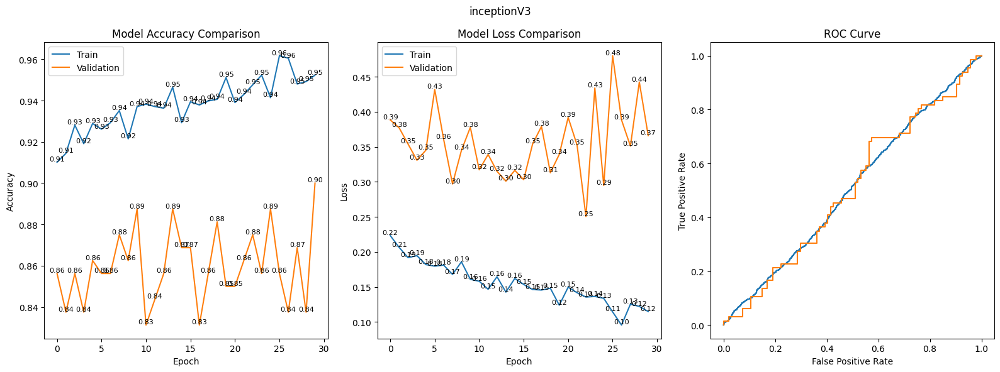

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


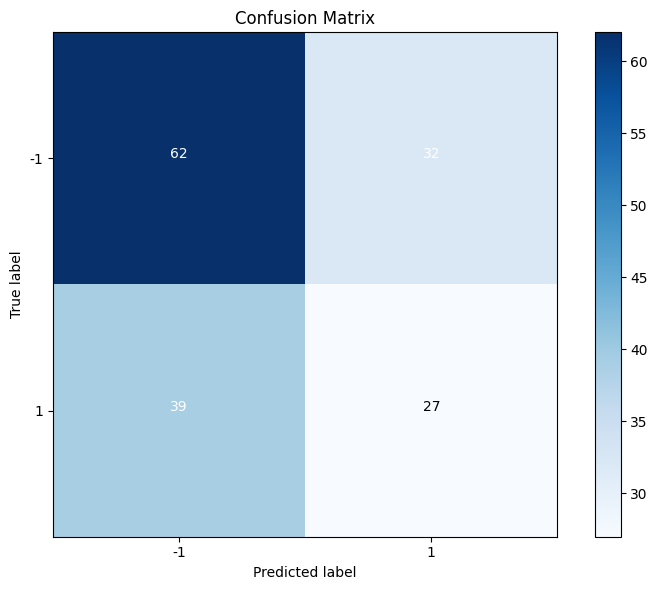

Model inceptionResNetV2 last accuracy: 0.961718738079071
Model inceptionResNetV2 last validation accuracy: 0.887499988079071
Model inceptionResNetV2 last loss: 0.0950295701622963
Model inceptionResNetV2 last validation loss: 0.0950295701622963
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 118ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


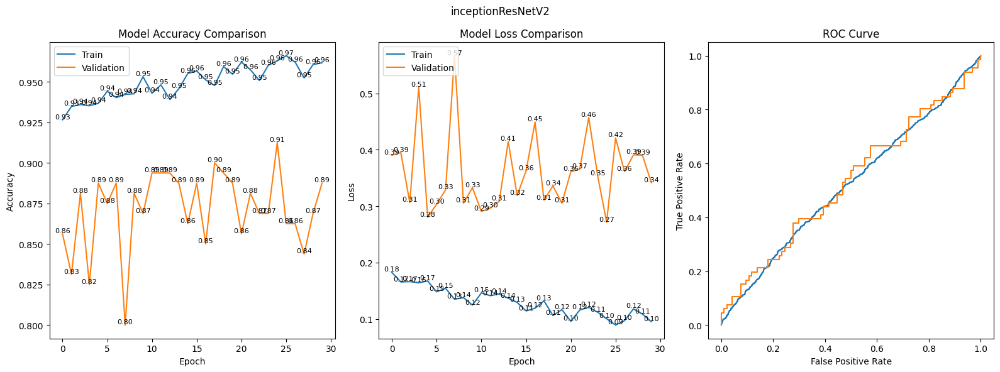

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


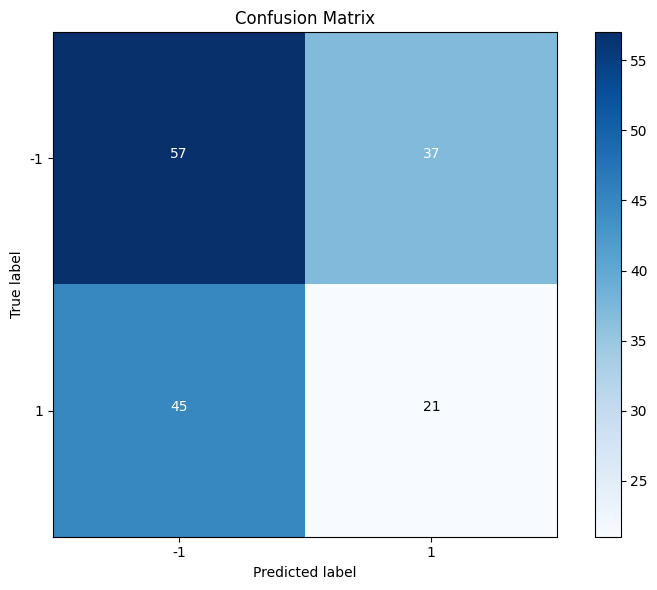

Model vgg16 last accuracy: 0.9097656011581421
Model vgg16 last validation accuracy: 0.875
Model vgg16 last loss: 0.2175092250108719
Model vgg16 last validation loss: 0.2175092250108719
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 119ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


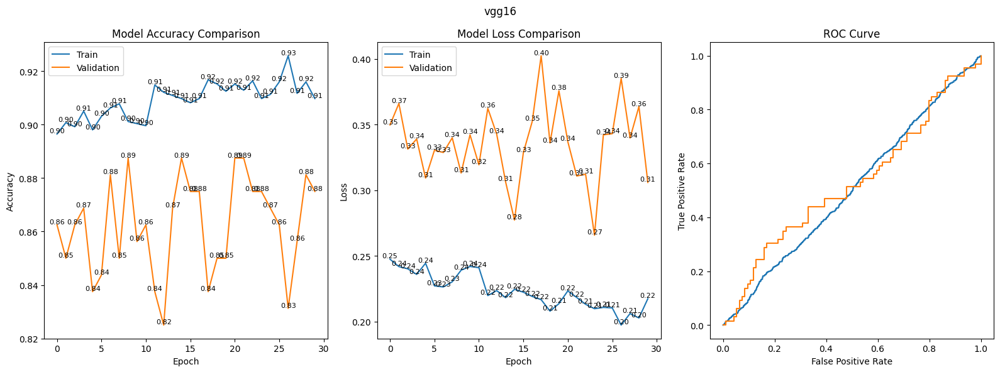

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


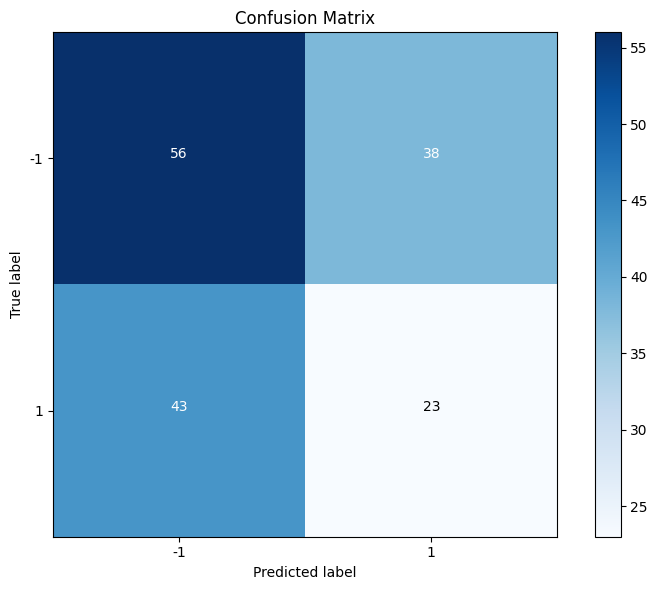

In [14]:
plot_histories(histories)

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step


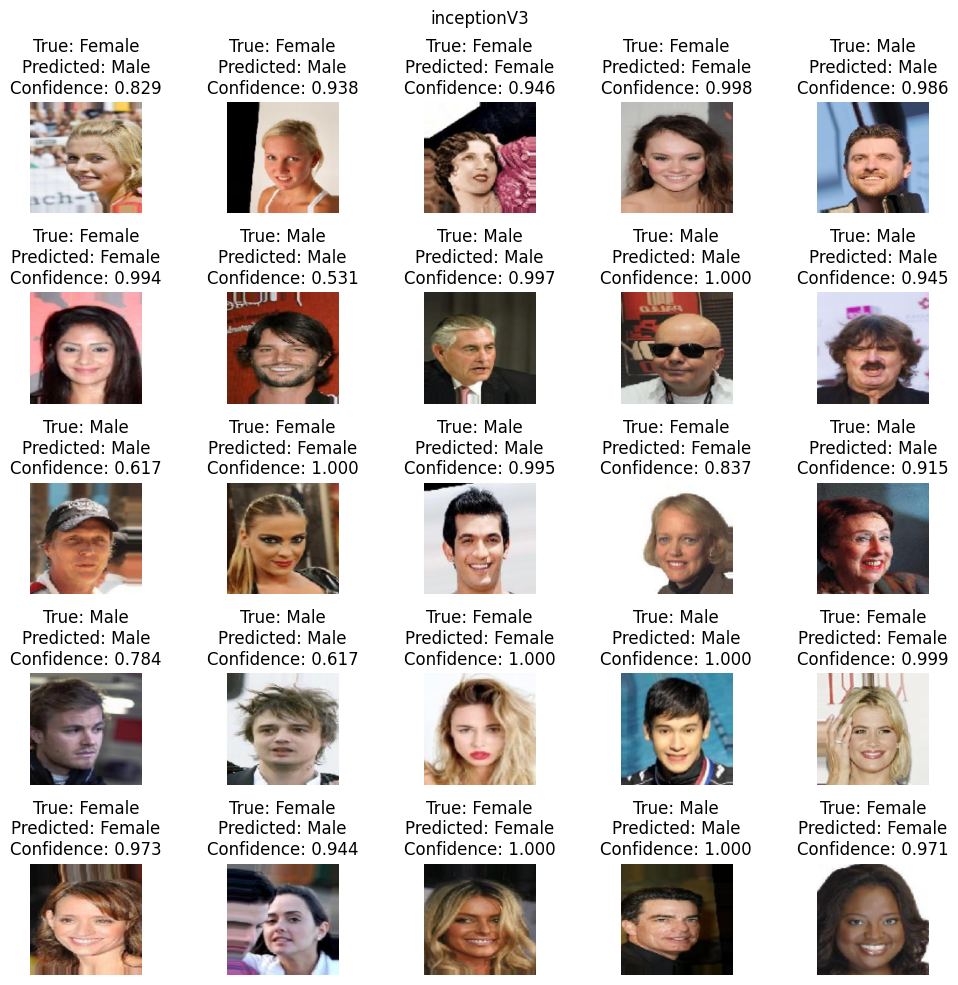

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 304ms/step


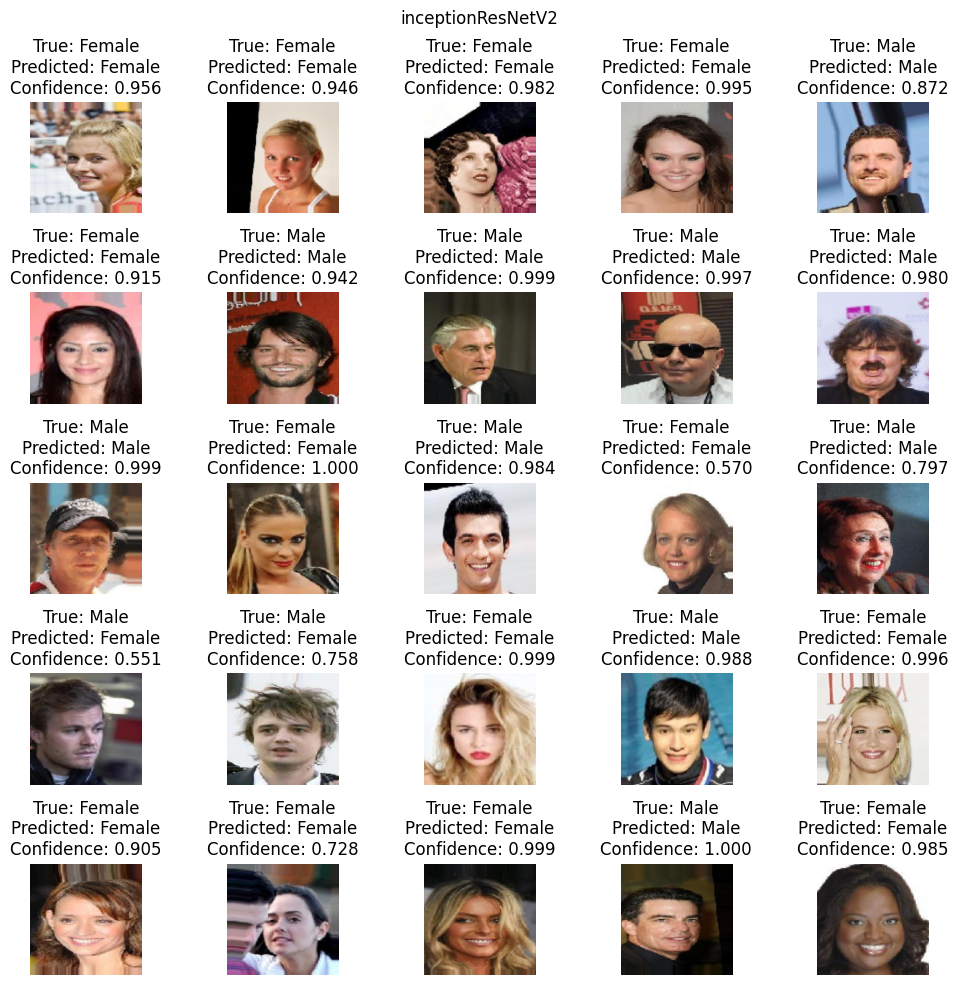

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step 


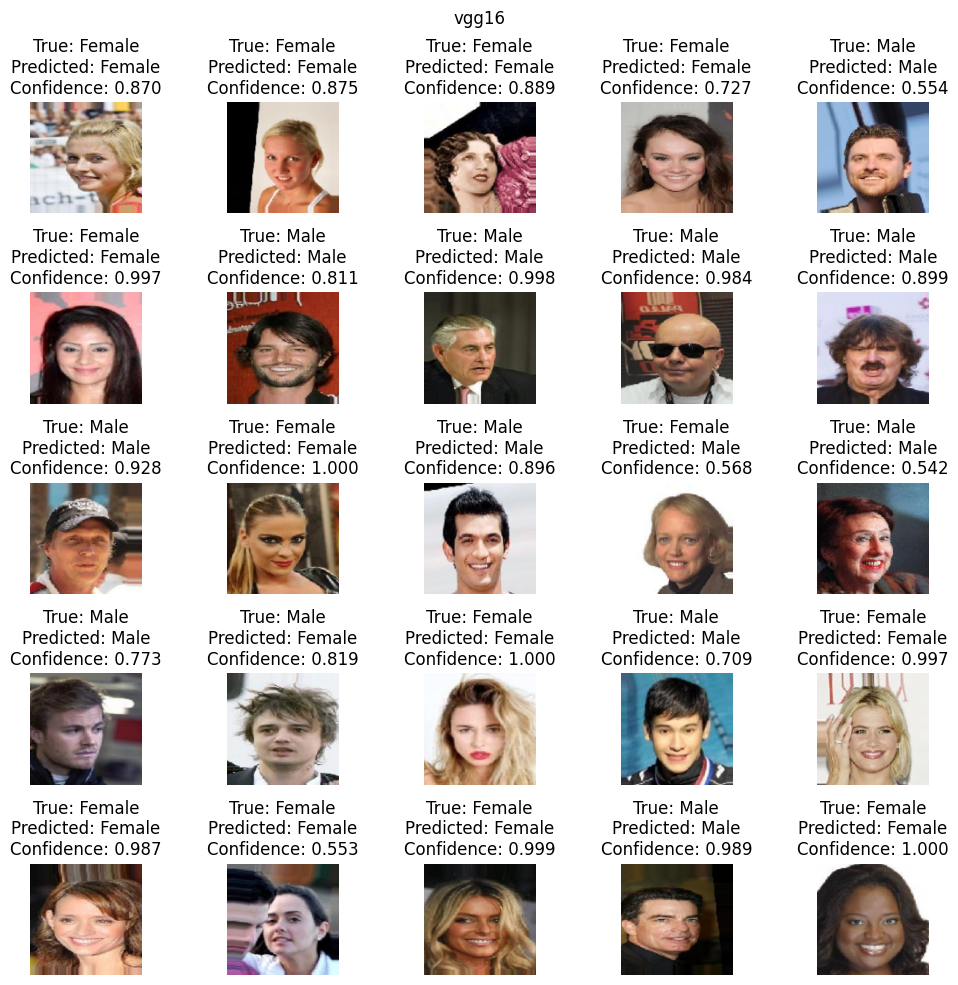

In [15]:
validation_generator.reset()

batch = next(validation_generator)

plot_prediction(models, batch)

## Save Model

In [16]:
for name, model in models.items():
  model.save(f"./output/{name}-iteration-2.keras")

# Model Iterations #3

Parameters:

1. Batch size: 64
2. Seed: 1024
3. Target Size: (178, 218)
4. Validation datasets size: 20%
5. Data test size: 20%
7. Additional fully connected layer:
   1. Global Conv 2d
   2. Relu
   3. Sigmoid
8. Epoch: 20
9.  Optimizers: adam
10. Pre-trained data: imagenet
11. Loss function: binary cross entropy
12. Layer freeze: true
13. Model input shape: default per model

Found 2560 validated image filenames belonging to 2 classes.
Found 160 validated image filenames belonging to 2 classes.


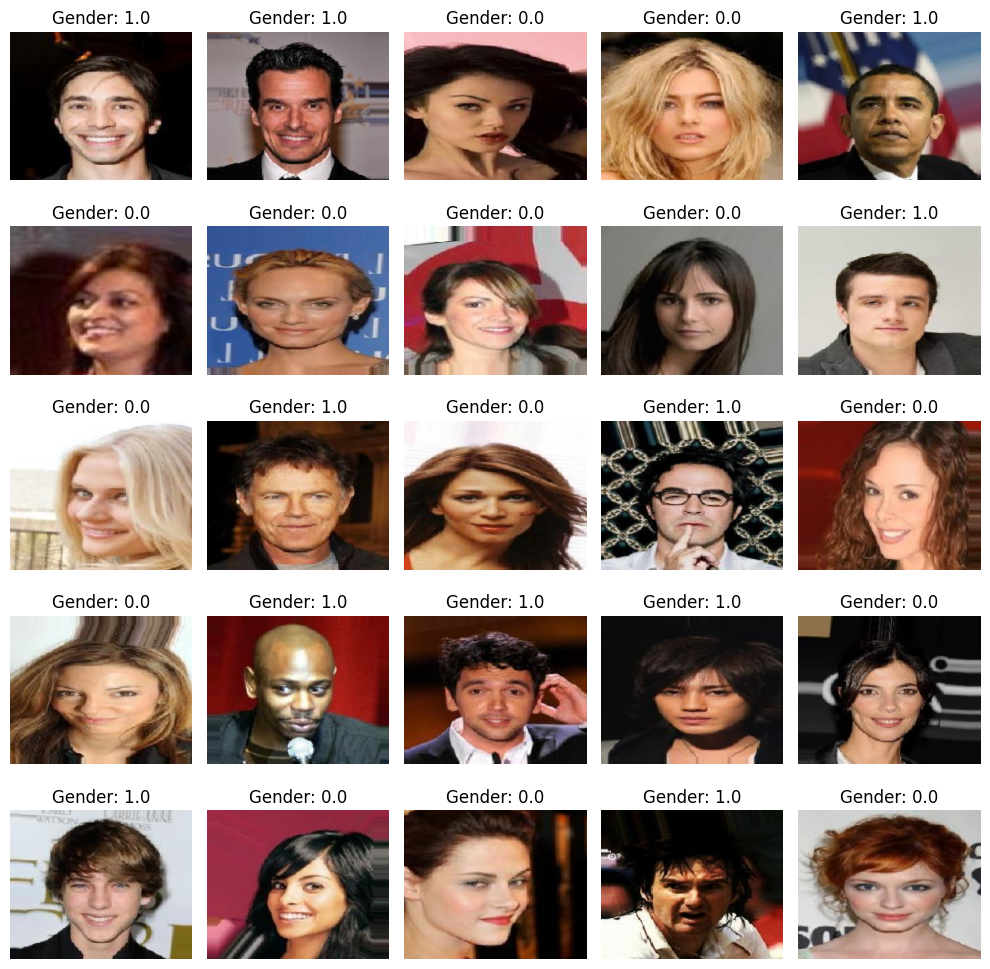

In [17]:
BATCH_SIZE = 64
SEED = 1024
TARGET_SIZE = (178, 218)

data_generator = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True, validation_split=0.2)

train_generator = data_generator.flow_from_dataframe(
 dataframe=train_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 subset='training',
 batch_size=BATCH_SIZE,
 seed=SEED,
 shuffle=True,
 class_mode='binary',
 target_size=TARGET_SIZE
)

validation_generator = data_generator.flow_from_dataframe(
 dataframe=validation_df,
 directory='images/',
 x_col='Filename',
 y_col='Male',
 subset='validation',
 batch_size=BATCH_SIZE,
 seed=SEED,
 shuffle=True,
 class_mode='binary',
 target_size=TARGET_SIZE
)

batch = next(train_generator)
fig, axs = plt.subplots(5, 5, figsize=(10, 10))
for i in range(5):
    for j in range(5):
        index = i*5+j
        axs[i, j].imshow(batch[0][index])
        axs[i, j].axis('off')
        axs[i, j].set_title(f'Gender: {batch[1][index]}')

plt.tight_layout()
plt.show()

## Model Training

In [18]:
models = {}

models['inceptionV3'] = input_model(InceptionV3(weights=WEIGHTS, include_top=False, classifier_activation=None))
models['inceptionResNetV2'] = input_model(InceptionResNetV2(weights=WEIGHTS, include_top=False, classifier_activation=None))
models['vgg16'] = input_model(VGG16(weights=WEIGHTS, include_top=False, classifier_activation=None))

models

Freezing layers for model: inception_v3
Adding fully connected layers for model: inception_v3
Freezing layers for model: inception_resnet_v2
Adding fully connected layers for model: inception_resnet_v2
Freezing layers for model: vgg16
Adding fully connected layers for model: vgg16


{'inceptionV3': <Functional name=functional_7, built=True>,
 'inceptionResNetV2': <Functional name=functional_9, built=True>,
 'vgg16': <Functional name=functional_11, built=True>}

In [19]:
histories = {}

for name, model in models.items():
  print(f"Start training for model: {name}")
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  history = model.fit(train_generator, epochs=20, validation_data=validation_generator)
  histories.update({name: history})

Start training for model: inceptionV3
Epoch 1/20


/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 567ms/step - accuracy: 0.7436 - loss: 0.6136 - val_accuracy: 0.8687 - val_loss: 0.2592
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - accuracy: 0.9094 - loss: 0.2206 - val_accuracy: 0.8813 - val_loss: 0.2607
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 231ms/step - accuracy: 0.9178 - loss: 0.2024 - val_accuracy: 0.9000 - val_loss: 0.2674
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 232ms/step - accuracy: 0.8975 - loss: 0.2221 - val_accuracy: 0.8313 - val_loss: 0.3314
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - accuracy: 0.9243 - loss: 0.1872 - val_accuracy: 0.8750 - val_loss: 0.2588
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 233ms/step - accuracy: 0.9227 - loss: 0.1830 - val_accuracy: 0.8875 - val_loss: 0.2854
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 230ms/step - accuracy: 0.9287 - loss: 0.1854 - val_accuracy: 0.8625 - val_loss: 0.2835
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 232ms/step - accuracy: 0.9254 - loss: 0.1705 - val_accuracy: 0.881

2024-03-18 07:13:45.131748: W external/local_tsl/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.73GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


40/40 ━━━━━━━━━━━━━━━━━━━━ 35s 457ms/step - accuracy: 0.6436 - loss: 0.6163 - val_accuracy: 0.8125 - val_loss: 0.4702
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - accuracy: 0.8239 - loss: 0.4171 - val_accuracy: 0.8313 - val_loss: 0.4007
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - accuracy: 0.8477 - loss: 0.3679 - val_accuracy: 0.8500 - val_loss: 0.3601
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 254ms/step - accuracy: 0.8713 - loss: 0.3078 - val_accuracy: 0.8125 - val_loss: 0.3907
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 255ms/step - accuracy: 0.8788 - loss: 0.2916 - val_accuracy: 0.8250 - val_loss: 0.3804
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - accuracy: 0.8869 - loss: 0.2669 - val_accuracy: 0.8188 - val_loss: 0.4072
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 255ms/step - accuracy: 0.8834 - loss: 0.2736 - val_accuracy: 0.8375 - val_loss: 0.3700
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 250ms/step - accuracy: 0.8917 - loss: 0.2575 - val_accuracy: 0.881

## Model Validations

Model inceptionV3 last accuracy: 0.958984375
Model inceptionV3 last validation accuracy: 0.9125000238418579
Model inceptionV3 last loss: 0.10248909890651703
Model inceptionV3 last validation loss: 0.10248909890651703
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 235ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 392ms/step


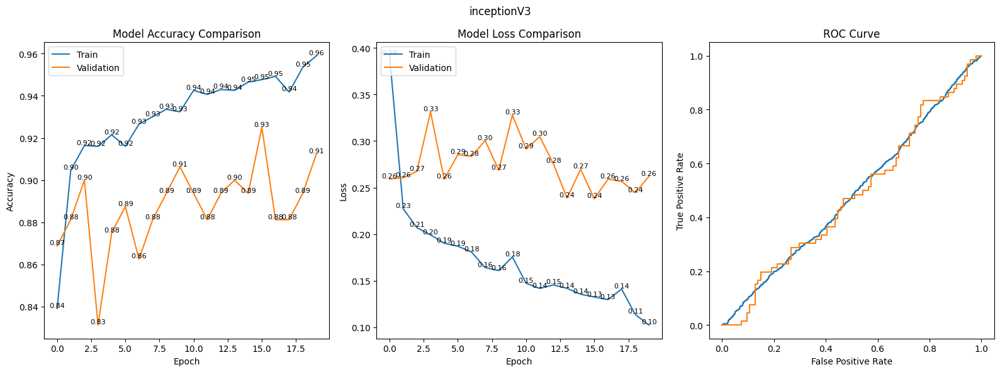

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step


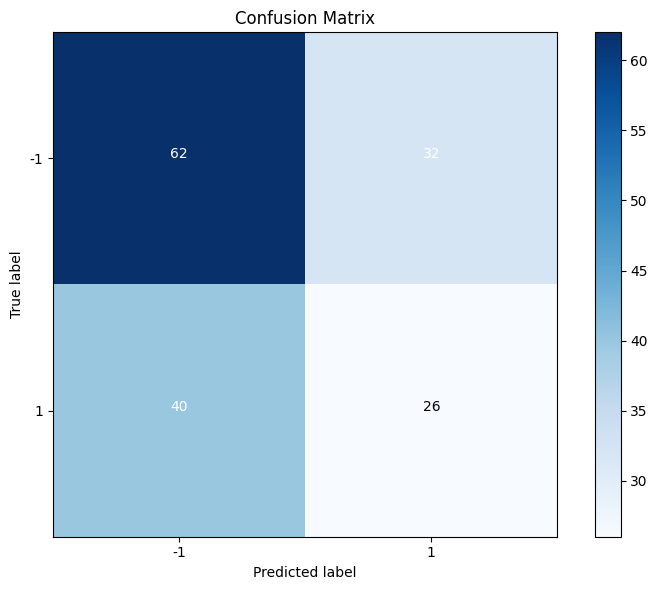

Model inceptionResNetV2 last accuracy: 0.951171875
Model inceptionResNetV2 last validation accuracy: 0.893750011920929
Model inceptionResNetV2 last loss: 0.11946799606084824
Model inceptionResNetV2 last validation loss: 0.11946799606084824
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 240ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step


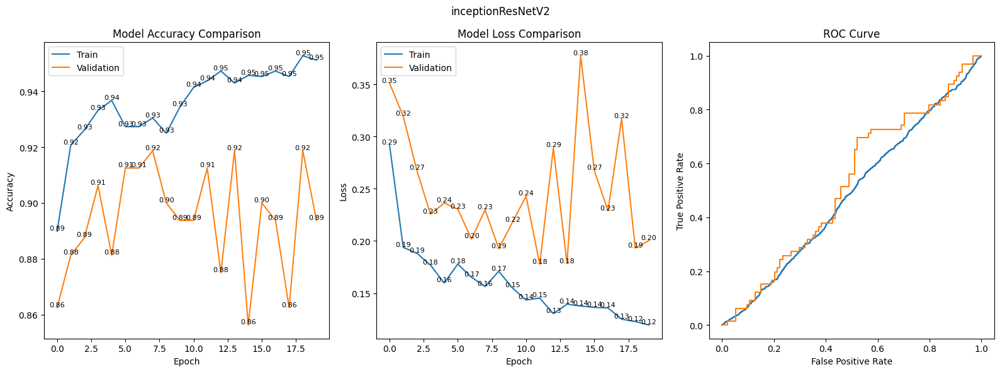

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step


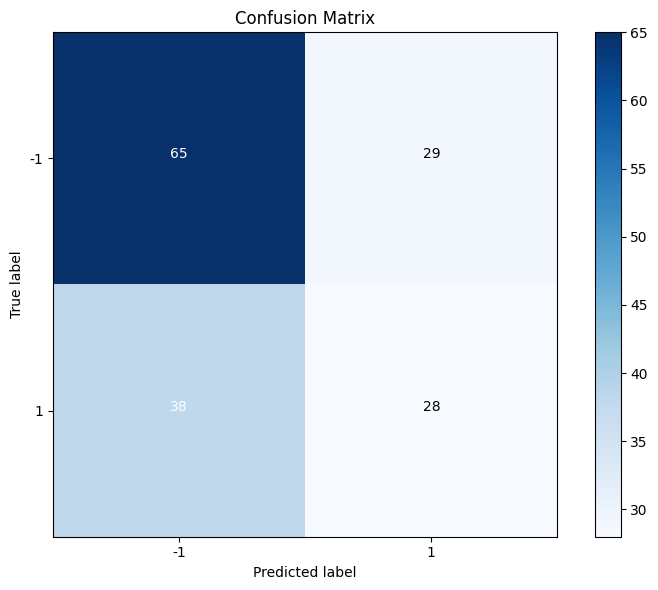

Model vgg16 last accuracy: 0.904296875
Model vgg16 last validation accuracy: 0.862500011920929
Model vgg16 last loss: 0.2247992753982544
Model vgg16 last validation loss: 0.2247992753982544
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 239ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step


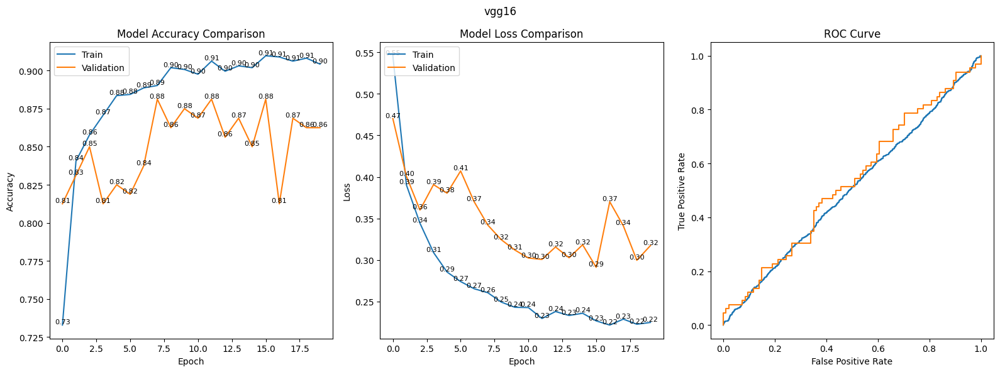

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step


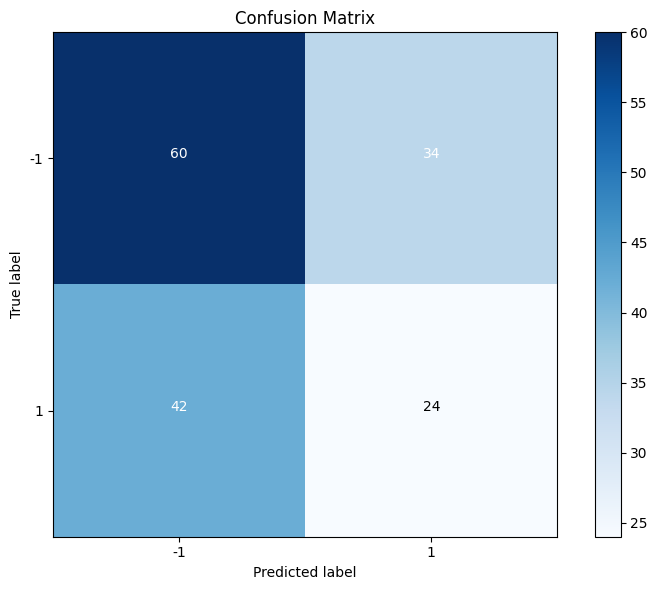

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 172ms/step


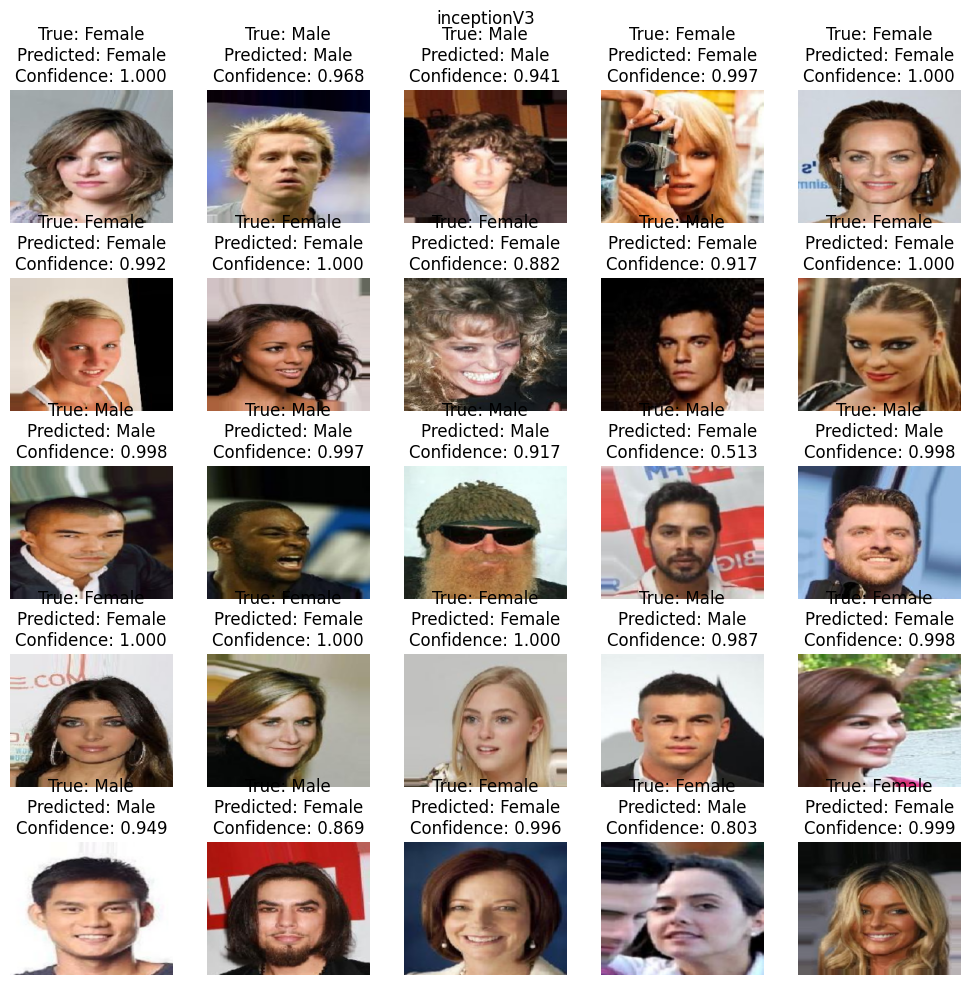

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step


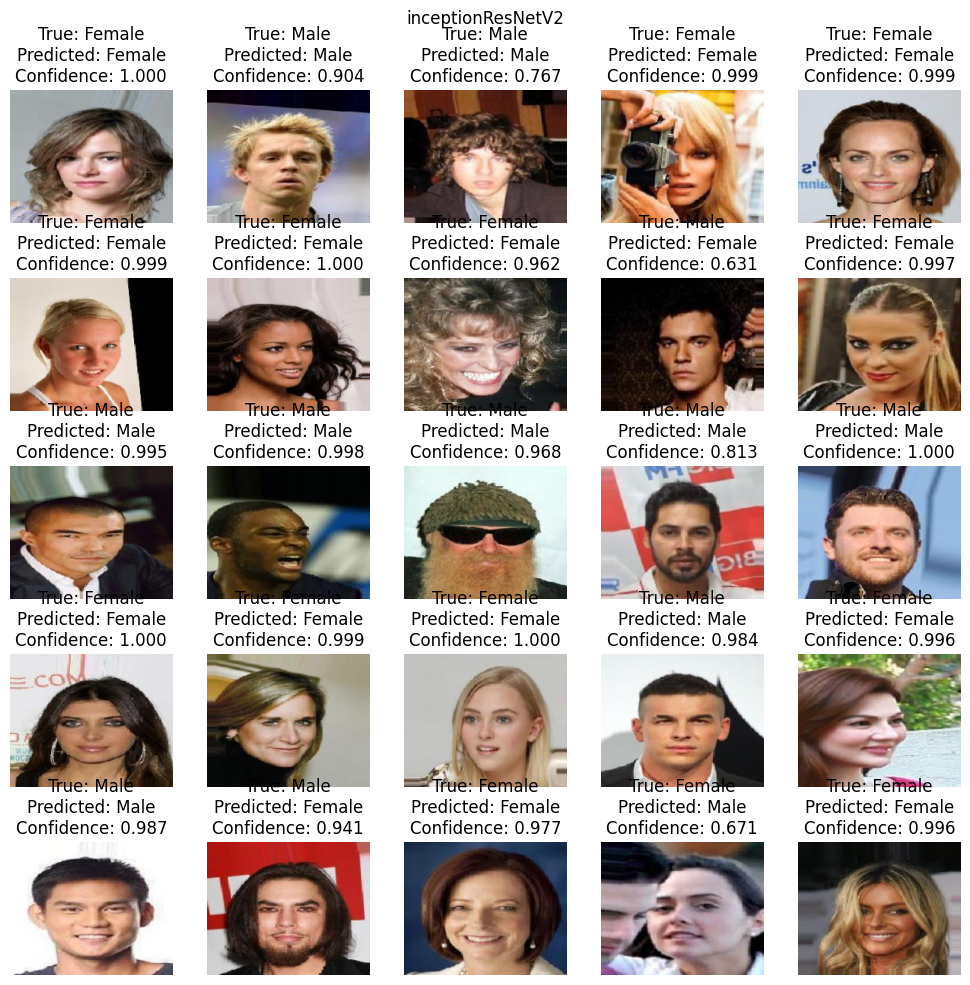

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step


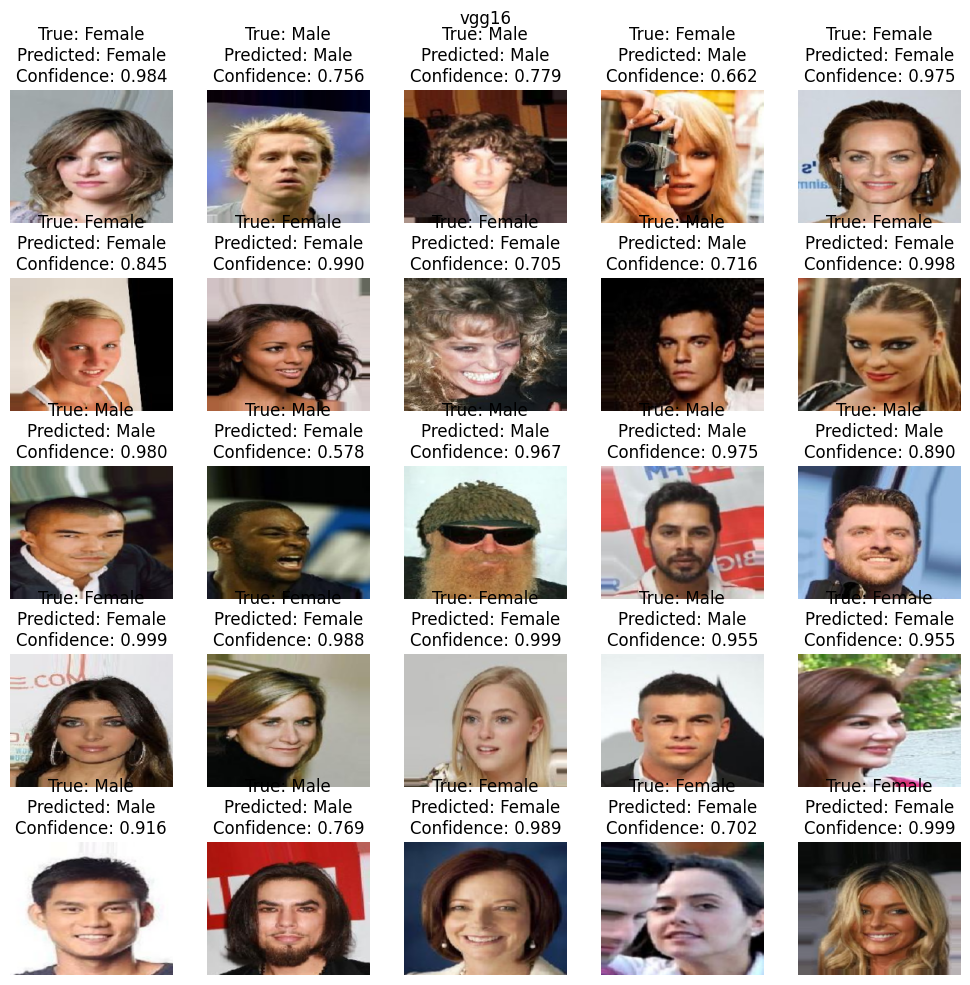

In [20]:
plot_histories(histories)

validation_generator.reset()

batch = next(validation_generator)

plot_prediction(models, batch)

## Save Model

In [21]:
for name, model in models.items():
  model.save(f"./output/{name}-iteration-3.keras")

# Evaluation and Testing Whole Model

In [22]:
list_model_dirs = os.listdir('output')

models = {}

for model_dir in list_model_dirs:
  if '.keras' in model_dir:
    print(f"Loading model: {model_dir}")
    models.update({model_dir: load_model(f"output/{model_dir}")})

models

Loading model: inceptionResNetV2-iteration-1.keras


/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 986 variables whereas the saved optimizer has 10 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


Loading model: inceptionV3-iteration-3.keras


/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 386 variables whereas the saved optimizer has 10 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


Loading model: vgg16-iteration-3.keras


/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 62 variables whereas the saved optimizer has 10 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


Loading model: vgg16-iteration-2.keras
Loading model: inceptionResNetV2-iteration-2.keras
Loading model: vgg16-iteration-1.keras
Loading model: inceptionV3-iteration-1.keras
Loading model: inceptionResNetV2-iteration-3.keras
Loading model: inceptionV3-iteration-2.keras


{'inceptionResNetV2-iteration-1.keras': <Functional name=functional_3, built=True>,
 'inceptionV3-iteration-3.keras': <Functional name=functional_7, built=True>,
 'vgg16-iteration-3.keras': <Functional name=functional_11, built=True>,
 'vgg16-iteration-2.keras': <Functional name=functional_5, built=True>,
 'inceptionResNetV2-iteration-2.keras': <Functional name=functional_3, built=True>,
 'vgg16-iteration-1.keras': <Functional name=functional_5, built=True>,
 'inceptionV3-iteration-1.keras': <Functional name=functional_1, built=True>,
 'inceptionResNetV2-iteration-3.keras': <Functional name=functional_9, built=True>,
 'inceptionV3-iteration-2.keras': <Functional name=functional_1, built=True>}

In [27]:
test_loss = []
test_accuracies = []
inference_times = []

for name, model in models.items():
  print(f"Evalutation for model: {name}")
  print(f"Model input shape: {model.input_shape}")

  TARGET_SIZE = (128, 128)
  if 'iteration-3' in name:
    TARGET_SIZE = (178, 218)

  test_data_generator = ImageDataGenerator(rescale=1./255)
  test_generator = test_data_generator.flow_from_dataframe(
    dataframe=test_df,
    directory='images/',
    x_col='Filename',
    y_col='Male',
    shuffle=False,
    class_mode='binary',
    target_size=TARGET_SIZE,

  )
  evaluation = model.evaluate(test_generator, steps=len(test_generator))
  print("Evaluation results", evaluation)

  print("Test Loss:", evaluation[0])
  print("Test Accuracy:", evaluation[1])

  start_time = time.time()
  predictions = model.predict(test_generator, steps=len(test_generator))
  end_time = time.time()
  inference_time = end_time - start_time

  print(f"Infference time: {inference_time:.5f} seconds")
  print("================================================")

  test_loss.append(evaluation[0])
  test_accuracies.append(evaluation[1])
  inference_times.append(inference_time)

Evalutation for model: inceptionResNetV2-iteration-1.keras
Model input shape: (None, 128, 128, 3)
Found 1000 validated image filenames belonging to 2 classes.


/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9016 - loss: 0.3150
Evaluation results [0.27986061573028564, 0.902999997138977]
Test Loss: 0.27986061573028564
Test Accuracy: 0.902999997138977
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step
Infference time: 1.84795 seconds
Evalutation for model: inceptionV3-iteration-3.keras
Model input shape: (None, None, None, 3)
Found 1000 validated image filenames belonging to 2 classes.
 3/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.8802 - loss: 0.3360 

/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.9014 - loss: 0.2539
Evaluation results [0.24166828393936157, 0.9160000085830688]
Test Loss: 0.24166828393936157
Test Accuracy: 0.9160000085830688
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step
Infference time: 1.30130 seconds
Evalutation for model: vgg16-iteration-3.keras
Model input shape: (None, None, None, 3)
Found 1000 validated image filenames belonging to 2 classes.
 1/32 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - accuracy: 0.9062 - loss: 0.2552

/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.9107 - loss: 0.2332
Evaluation results [0.23335587978363037, 0.9110000133514404]
Test Loss: 0.23335587978363037
Test Accuracy: 0.9110000133514404
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step
Infference time: 2.63019 seconds
Evalutation for model: vgg16-iteration-2.keras
Model input shape: (None, 128, 128, 3)
Found 1000 validated image filenames belonging to 2 classes.
 3/32 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.9306 - loss: 0.2359 

/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.9010 - loss: 0.2592
Evaluation results [0.2548586428165436, 0.8970000147819519]
Test Loss: 0.2548586428165436
Test Accuracy: 0.8970000147819519
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step
Infference time: 1.13985 seconds
Evalutation for model: inceptionResNetV2-iteration-2.keras
Model input shape: (None, 128, 128, 3)
Found 1000 validated image filenames belonging to 2 classes.


/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.8723 - loss: 0.3653
Evaluation results [0.34083765745162964, 0.8840000033378601]
Test Loss: 0.34083765745162964
Test Accuracy: 0.8840000033378601
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step
Infference time: 1.82169 seconds
Evalutation for model: vgg16-iteration-1.keras
Model input shape: (None, 128, 128, 3)
Found 1000 validated image filenames belonging to 2 classes.
 3/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.9184 - loss: 0.2642

/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.9058 - loss: 0.2674
Evaluation results [0.2604379951953888, 0.9010000228881836]
Test Loss: 0.2604379951953888
Test Accuracy: 0.9010000228881836
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step
Infference time: 1.14255 seconds
Evalutation for model: inceptionV3-iteration-1.keras
Model input shape: (None, 128, 128, 3)
Found 1000 validated image filenames belonging to 2 classes.
 1/32 ━━━━━━━━━━━━━━━━━━━━ 9s 292ms/step - accuracy: 0.8125 - loss: 0.4920

/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.8418 - loss: 0.3878
Evaluation results [0.3361065685749054, 0.8629999756813049]
Test Loss: 0.3361065685749054
Test Accuracy: 0.8629999756813049
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Infference time: 0.72984 seconds
Evalutation for model: inceptionResNetV2-iteration-3.keras
Model input shape: (None, None, None, 3)
Found 1000 validated image filenames belonging to 2 classes.


/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9201 - loss: 0.2092
Evaluation results [0.17529726028442383, 0.9269999861717224]
Test Loss: 0.17529726028442383
Test Accuracy: 0.9269999861717224
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step
Infference time: 2.87814 seconds
Evalutation for model: inceptionV3-iteration-2.keras
Model input shape: (None, 128, 128, 3)
Found 1000 validated image filenames belonging to 2 classes.
 4/32 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8281 - loss: 0.5115 

/home/insomnius/.pyenv/versions/3.11.6/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.8557 - loss: 0.4097
Evaluation results [0.39616650342941284, 0.8640000224113464]
Test Loss: 0.39616650342941284
Test Accuracy: 0.8640000224113464
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
Infference time: 0.81443 seconds


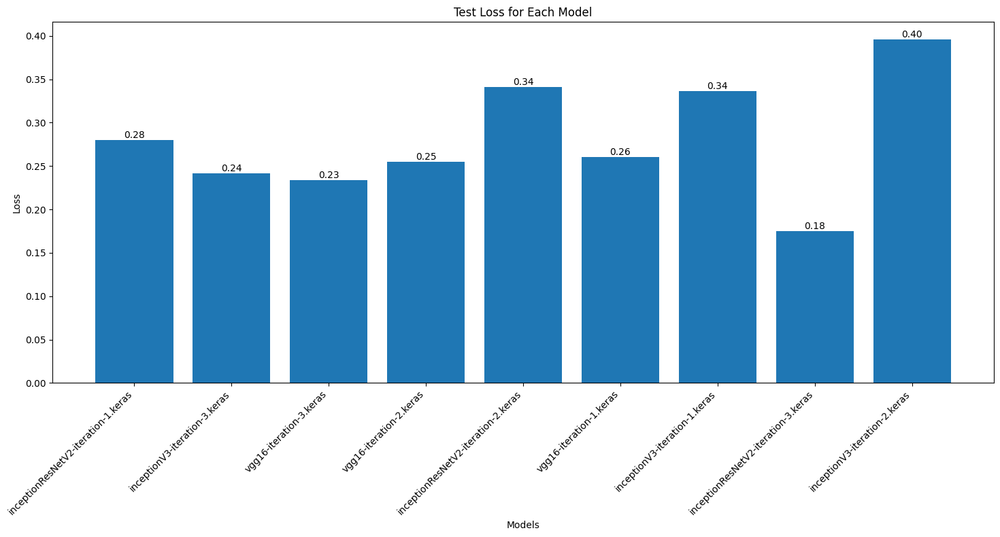

In [28]:
fig, ax = plt.subplots(figsize=(15, 8))

bars = ax.bar(models.keys(), test_loss, color='tab:blue')
for bar, loss in zip(bars, test_loss):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{loss:.2f}', ha='center', va='bottom')

ax.set_xlabel('Models')
ax.set_ylabel('Loss')
ax.set_title('Test Loss for Each Model')

plt.xticks(rotation=45, ha='right')

fig.tight_layout()
plt.show()

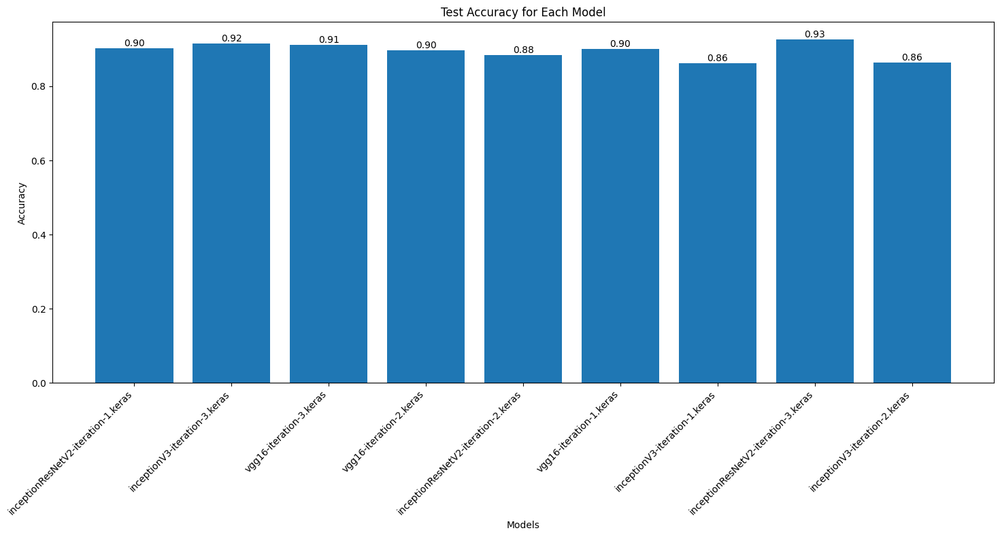

In [29]:
fig, ax = plt.subplots(figsize=(15, 8))

bars = ax.bar(models.keys(), test_accuracies, color='tab:blue')
for bar, loss in zip(bars, test_accuracies):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{loss:.2f}', ha='center', va='bottom')

ax.set_xlabel('Models')
ax.set_ylabel('Accuracy')
ax.set_title('Test Accuracy for Each Model')

plt.xticks(rotation=45, ha='right')

fig.tight_layout()
plt.show()

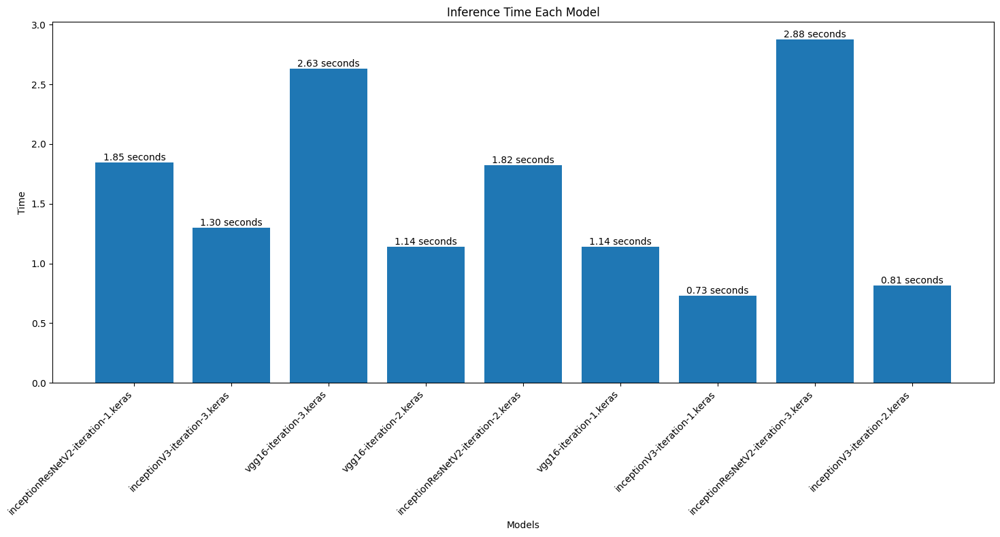

In [30]:
fig, ax = plt.subplots(figsize=(15, 8))

bars = ax.bar(models.keys(), inference_times, color='tab:blue')
for bar, loss in zip(bars, inference_times):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{loss:.2f} seconds', ha='center', va='bottom')

ax.set_xlabel('Models')
ax.set_ylabel('Time')
ax.set_title('Inference Time Each Model')

plt.xticks(rotation=45, ha='right')

fig.tight_layout()
plt.show()

# **Summary and Winner Selection:**
---------------------------------

Based on the latest evaluation results of multiple deep learning models for image classification, the following summary and winner have been determined:

| Model                      | Test Accuracy | Test Loss | Inference Time (seconds) |
|----------------------------|---------------|-----------|--------------------------|
| inceptionV3-iter-1         |     0.863     |   0.336   |          0.730           |
| inceptionV3-iter-2         |     0.864     |   0.396   |          0.814           |
| inceptionV3-iter-3         |     0.916     |   0.242   |          1.301           |
| inceptionResNetV2-iter-1   |     0.903     |   0.280   |          1.848           |
| inceptionResNetV2-iter-2   |     0.884     |   0.341   |          1.822           |
| inceptionResNetV2-iter-3   |     0.927     |   0.175   |          2.878           |
| vgg16-iter-1               |     0.901     |   0.260   |          1.143           |
| vgg16-iter-2               |     0.897     |   0.255   |          1.140           |
| vgg16-iter-3               |     0.911     |   0.233   |          2.630           |

**Winner Selection Reasoning:**
-------------------------------

After careful consideration of test accuracy, test loss, and inference time, the model "inceptionResNetV2-iteration-3.keras" emerged as the winner. With a test accuracy of 92.7% and a test loss of 0.175, it demonstrates strong performance in classification accuracy and model efficiency. While its inference time of 2.878 seconds is not the fastest among the evaluated models, it remains reasonable for practical deployment. Therefore, this model strikes a balanced combination of accuracy and efficiency, making it the optimal choice for the given task of image classification.
